# Case Study: Unterstanding Mental Health in Technology-Related Companies (Script 3)
## Feature Selection, PCA and Cluster Analysis

Overview
* perform feature selection based on the variance criterion due to the high number of features in the preprocessed dataset
* perform a principal component analysis (PCA) of the data and interpret the results
* reduce the dimensionality of the dataset based on the results of PCA
* perform several cluster analyses of the reduced dataset, select an appropriate cluster solution and interpret the results

## 1 Imports and General Settings

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import functions_mhd as f
import itertools
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
import seaborn as sns
from sklearn.decomposition import PCA

# imports to perform Gaussian mixture model clustering
from sklearn import mixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# imports to interpret the cluster solution
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from bioinfokit.analys import stat

In [2]:
# set the pandas options to show all columns and all rows of data frames as well as the entire cell contents
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_colwidth', None)  

# suppress scientific notation in numpy arrays
np.set_printoptions(suppress=True, threshold=np.inf) 

# suppress scientific notation in pandas 
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# set style of seaborn graphics 
sns.set_theme(style='ticks', color_codes=True)

## 2 Feature Selection

In [3]:
# load the numerically encoded dataset
df_enc = pd.read_csv('df_enc.csv')

### 2.1 Variance Threshold

* exclude binary variables (i.e., variables with two response alternatives) based on the variance criterion also used by Sunil and RamaSree (2015, pp. 1-2), because variables with low variance are not very informative for machine learning algorithms (Bonaccorso, 2020, p. 382; Dhanya et al., 2020, p. 1565)

In [4]:
# calculate the variance threshold used by Sunil and RamaSree (2015, pp. 1-2) 
var_threshold = np.var([0] * 95 + [1] * 5) 
print('variance threshold: ', var_threshold)

variance threshold:  0.0475


Observations
* the variance criterion used in Sunil and RamaSree (2015, pp. 1-2) would exclude all variables with a variance of less than 0.0475

In [5]:
# apply the variance threshold feature selection technique
selector = VarianceThreshold(threshold=var_threshold)
df_features_selected = selector.fit_transform(df_enc)

# check which features would be excluded based on the variance threshold criterion to ensure that only binary features would be excluded
df_variances = pd.DataFrame({'column': df_enc.columns, 'variances': selector.variances_, 'selected': selector.get_support()})
df_variances_not_selected = df_variances[df_variances['selected'] == False]
df_variances_not_selected

,column,variances,selected
30,self_employed,0.000,False
35,(1) ADD (w/o Hyperactivity),0.001,False
36,(1) Addictive Disorder,0.021,False
38,(1) Asperges,0.001,False
40,(1) Autism,0.000,False
41,(1) Autism (Asperger's),0.001,False
42,(1) Autism Spectrum Disorder,0.000,False
43,(1) Autism spectrum disorder,0.001,False
44,(1) Dissociative Disorder,0.005,False
45,"(1) Eating Disorder (Anorexia, Bulimia, etc)",0.020,False


Observations
* most features excluded based on the variance criterion are variables that capture diagnoses
* three features are part of one-hot encoded nominally scaled variables; two of the three features should not be excluded for this reason. However, the mental_illness_treated feature should be excluded because only very few individuals with mental disorders have not received treatment and thus the feature differs only very marginally from the mhd_anytime feature and is therefore not very informative. 

In [6]:
# determine which features to exclude from the dataset based on the variance threshold
treated_cols = [col for col in df_enc.columns if 'mental_illness_treated' in col]
low_variance_features = df_variances_not_selected['column'].tolist()
not_to_exclude = ['employer_anonymity_mh_benefits_No', 'mental_illness_treated_0', 'gender_other']
to_drop = [feat for feat in low_variance_features if feat not in not_to_exclude] + treated_cols

# remove the features that were rightly not selected based on the variance threshold from the dataset
print('shape before dropping the features:', df_enc.shape)
df_enc_v2 = df_enc.drop(columns=to_drop)
print('shape after dropping the features:', df_enc_v2.shape)

shape before dropping the features: (829, 166)
shape after dropping the features: (829, 96)


Observations
* using the variance threshold criterion as feature selection technique, a total of 70 features were excluded

### 2.2 Similarity of Content

* a few variables (all variables relating to work conditions as well as one variable capturing whether one had previous employers) are assumed to have little to do with the other variables in terms of content
* create a correlation matrix to check this and to generally get an impression of the correlations of all variables among each other

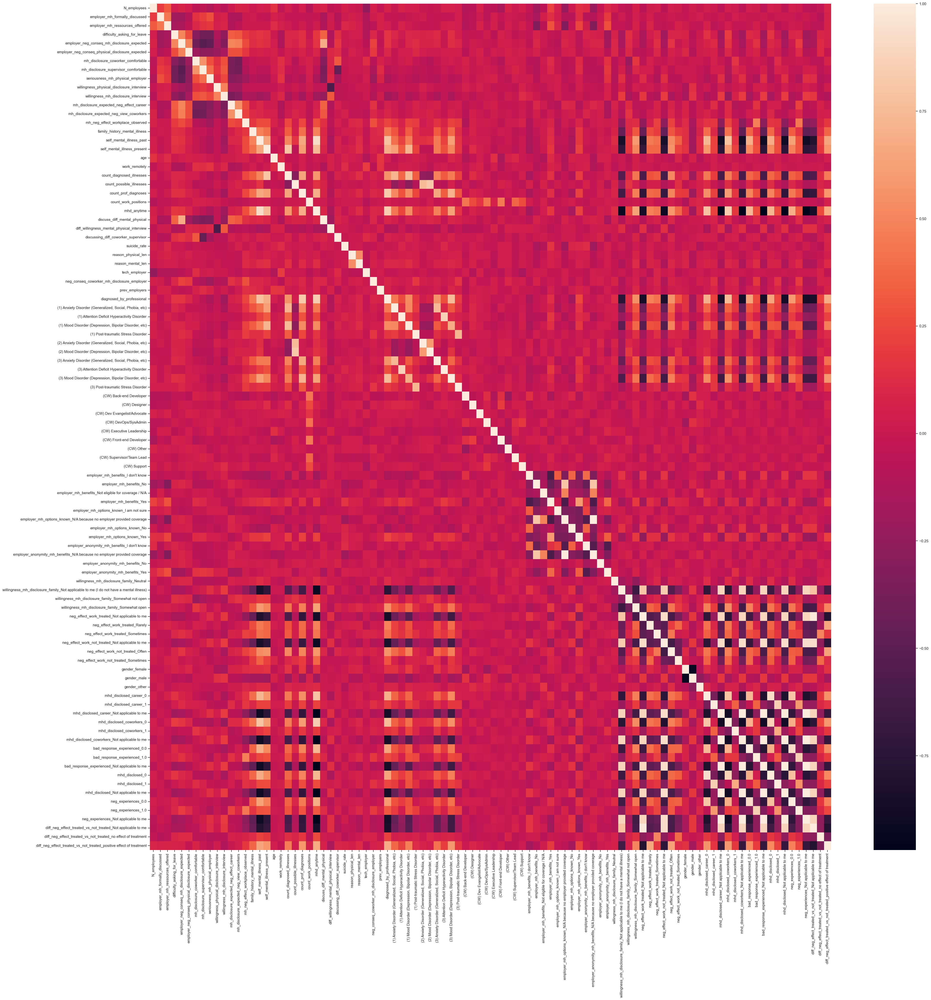

In [7]:
# create a correlation matrix
corr_matrix = df_enc_v2.corr(method='kendall')
plt.figure(figsize=(45,45))
sns.heatmap(corr_matrix)
plt.show()

Observations
* most correlations are rather low (between -.25 and .25)
* all work position variables show very low correlations with the rest of the variables, as expected
* the variable that captures whether individuals have had previous employers shows very low correlations with the rest of the variables, as expected
* many features capture whether individuals have ever suffered from a mental disorder (e.g., the mhd_anytime feature and all features that code whether someone was assigned to a "not applicable" response category due to never having had a mental disorder), resulting in very high correlations among these variables

In [8]:
# drop the work position features as well as the feature that captures whether individuals have had previous employers
cw_columns = [col for col in df_enc_v2.columns if '(CW)' in col or 'work_positions' in col]
print('shape before dropping the features:', df_enc_v2.shape)
df_selected = df_enc_v2.drop(columns=cw_columns + ['prev_employers'])
print('shape after dropping the features:', df_selected.shape)

shape before dropping the features: (829, 96)
shape after dropping the features: (829, 85)


Observations
* the final dataset which will be used for the PCA includes data from 829 respondents on 85 features

## 3 Principal Component Analysis

* standardize feature values because PCA is sensitive to different units of measurement (Jolliffe & Cadima, 2016, pp. 5-6)
* perform a PCA on the dataset
* decide how many principal components (PCs) to keep based on different criteria
* compute the loading matrix to interpret what the PCs capture
* transform the data using the PCA and the specified number of PCs

In [9]:
# standardize feature values
st = StandardScaler().fit_transform(df_selected)
df_pca = pd.DataFrame(st, columns=df_selected.columns)

explained variances:
[0.24205322 0.0665532  0.05501378 0.04884773 0.03601916 0.02925559
 0.02585965 0.02494772 0.02393948 0.02229246 0.02124452 0.01968732
 0.01906551 0.01872585 0.01760708 0.01670829 0.01628387 0.01468545
 0.01428845 0.01361119 0.01344404 0.01287352 0.01253118 0.01214704
 0.01184    0.01158307 0.01095948 0.01045117 0.01004492 0.00963257
 0.00954388 0.00887444 0.00867792 0.00843428 0.00826339 0.0076542
 0.00736497 0.00691671 0.00666935 0.00636777 0.00571861 0.00541051
 0.00519447 0.00496509 0.00492365 0.00448313 0.00416409 0.00409399
 0.00331464 0.00276956 0.0020546  0.0018158  0.00167141 0.0014758
 0.00137801 0.00134684 0.00118671 0.00102204 0.00084555 0.0005361
 0.0004036  0.00016626 0.00009614 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.        ]

cumulative explained variances:
[0.24205322 0.30860642 0.36362

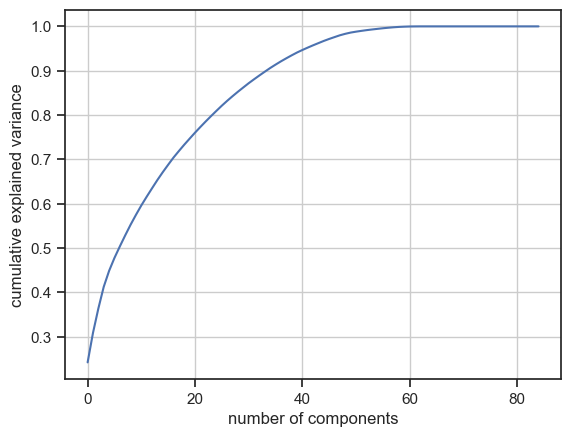

In [10]:
# perform a PCA using the random_state parameter so that the results are reproducible
pca = PCA(random_state=5).fit(df_pca)

# extract the explained variance ratios
var_exp = pca.explained_variance_ratio_
print('explained variances:')
print(var_exp)

# calculate the explained cumulative variance
cum_var_exp = np.cumsum(var_exp)
print('\ncumulative explained variances:')
print(cum_var_exp)

# plot the cumulative explained variance ratio as a function of the number of components
plt.plot(cum_var_exp)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.grid()

Observations
* the first three PCs explain 24% (PC 1), 7% (PC 2) and 6% (PC 3) of the variance in the data
* 25 PCs are needed to explain 81% of the variance in the data

### 3.1 Deciding How Many Principal Components to Retain

* decide based on a scree plot and the Kaiser criterion how many PCs to retain

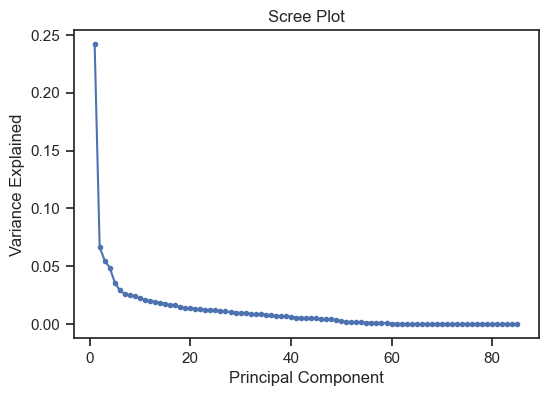

In [11]:
# display a scree plot for the PCA
plt.figure(figsize=(6,4))
pc_values = np.arange(pca.n_components_) + 1 # so that the first PC is PC 1 and not PC 0 etc.
plt.plot(pc_values, pca.explained_variance_ratio_, '.-')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

Observations
* the scree plot suggests keeping the first six PCs
* the first six PCs explain about 48% of the variance in the data

In [12]:
# show the eigenvalues of the PCs to apply the Kaiser criterion
eigenvalues = pca.explained_variance_
print(eigenvalues)

[20.59937178  5.66385423  4.68181851  4.15707179  3.06532642  2.48972836
  2.20072451  2.12311753  2.03731352  1.8971475   1.8079649   1.675443
  1.62252589  1.59361932  1.49840905  1.42191996  1.38580023  1.24977042
  1.21598471  1.15834872  1.14412313  1.09557064  1.06643646  1.03374558
  1.00761587  0.98575007  0.93268081  0.88942274  0.85484954  0.81975744
  0.81220947  0.755238    0.73851415  0.71777977  0.70323662  0.65139253
  0.62677823  0.58863078  0.5675796   0.54191375  0.48666928  0.46044887
  0.44206307  0.42254249  0.41901562  0.38152605  0.35437531  0.34840908
  0.2820844   0.23569685  0.17485204  0.15452922  0.14224139  0.12559441
  0.11727217  0.11461943  0.1009923   0.08697861  0.07195868  0.04562369
  0.03434773  0.01414909  0.0081817   0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.        

Observations
* the Kaiser criterion suggests keeping the first 25 PCs, as they have eigenvalues greater than one
* since the proportion of cumulative explained variance is higher when the Kaiser criterion is applied than when the scree plot criterion is applied, and thus more main characteristics of the original dataset are preserved, the solution suggested by the Kaiser criterion is chosen

### 3.2 Interpreting Principal Components

* interpret the PCs' meaning based on the loading matrix 

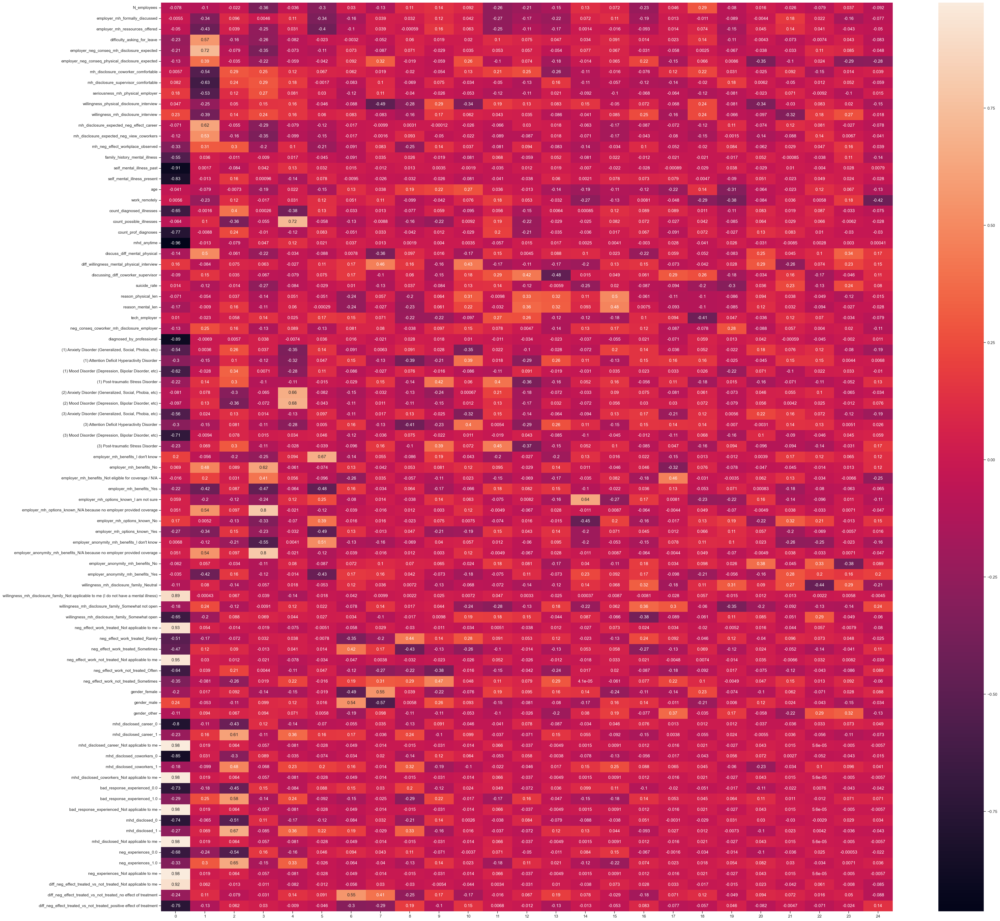

In [13]:
# compute the loading matrix
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
loading_matrix = pd.DataFrame(loadings, index=df_pca.columns)

# plot the loading matrix as a heatmap to facilitate the search for high and small loadings 
plt.figure(figsize=(45,45))
sns.heatmap(loading_matrix.iloc[:, :25], annot=True) # show only the retained 25 components 
plt.show()

Observations
* the loading matrix is quite complex
* especially for the first PC, there are many variables with very high loadings (> .9), where the variables mostly indicate the presence of a mental disorder

In [14]:
# to facilitate interpretation of the PCs, create a new table that shows the variables and their loadings for each PC in descending order of the magnitude of the absolute loadings
header_1 = []  # for the multi index header of the table
header_2 = []  # for the multi index header of the table 
df_sorted_loadings = pd.DataFrame()  # create an empty data frame that later contains the loadings 

for col in loading_matrix:
    header_1 += [col] * 2
    header_2 += ['var', 'val']
    df_interim = loading_matrix[col].to_frame()  # a data frame containing the variable names as index
    df_interim['abs_val'] = df_interim[col].abs()  # to be able to sort according to the absolute values 
    df_interim.sort_values('abs_val', inplace=True, ascending=False)  
    df_interim.drop(columns='abs_val', inplace=True)  
    df_interim_v2 = pd.DataFrame(zip(df_interim.index.tolist(), df_interim[col].tolist()), columns=['var', 'val']) 
    df_sorted_loadings = pd.concat([df_sorted_loadings, df_interim_v2], axis=1)
        
header = [header_1, header_2]  # to create the multi index header
df_sorted_loadings.columns=header
df_sorted_loadings

0   \
                                                                                       var   
0                                                       mhd_disclosed_Not applicable to me   
1                                                     neg_experiences_Not applicable to me   
2                                                mhd_disclosed_career_Not applicable to me   
3                                             mhd_disclosed_coworkers_Not applicable to me   
4                                            bad_response_experienced_Not applicable to me   
5                                                                              mhd_anytime   
6                                         neg_effect_work_not_treated_Not applicable to me   
7                                             neg_effect_work_treated_Not applicable to me   
8                              diff_neg_effect_treated_vs_not_treated_Not applicable to me   
9                                                                 self_mental_illness_past   
10                                                               diagnosed_by_professional   
11  willingness_mh_disclosure_family_Not applicable to me (I do not have a mental illness)   
12                                                               mhd_disclosed_coworkers_0   
13                                                             self_mental_illness_present   
14                                                                  mhd_disclosed_career_0   
15                                                                    count_prof_diagnoses   
16                     diff_neg_effect_treated_vs_not_treated_positive effect of treatment   
17                                                                         mhd_disclosed_0   
18                                                            bad_response_experienced_0.0   
19                                   (3) Mood Disorder (Depression, Bipolar Disorder, etc)   
20                                                                     neg_experiences_0.0   
21                                                               count_diagnosed_illnesses   
22                                          willingness_mh_disclosure_family_Somewhat open   
23                                                       neg_effect_work_not_treated_Often   
24                                   (1) Mood Disorder (Depression, Bipolar Disorder, etc)   
25                                 (3) Anxiety Disorder (Generalized, Social, Phobia, etc)   
26                                                           family_history_mental_illness   
27                                 (1) Anxiety Disorder (Generalized, Social, Phobia, etc)   
28                                                          neg_effect_work_treated_Rarely   
29                                                       neg_effect_work_treated_Sometimes   
30                                                   neg_effect_work_not_treated_Sometimes   
31                                                                     neg_experiences_1.0   
32                                                        mh_neg_effect_workplace_observed   
33                                            (1) Attention Deficit Hyperactivity Disorder   
34                                            (3) Attention Deficit Hyperactivity Disorder   
35                                                            bad_response_experienced_1.0   
36                                                                         mhd_disclosed_1   
37                                                           employer_mh_options_known_Yes   
38                           diff_neg_effect_treated_vs_not_treated_no effect of treatment   
39                                                                             gender_male   
40                                                     willingness_mh_disclosure_interview   
41                                            

Observations
* PC 1: variables load very high on PC1, capturing whether or not someone had a mental health disorder at some point in time
* PC 2:
    * variables with the highest absolute loadings on PC 2 capture,
        * the extent to which someone expects negative consequences after disclosing their mental disorder in the work context
        * how comfortable someone fells telling their supervisor about their mental disorder
        * how difficult someone finds it to ask for a medical leave due to mental illness from their employer
    * variables load moderately on PC 2 that address the differential treatment of mental vs. physical problems in the work context
* PC 3: variables with the highest absolute loadings on PC 3 capture whether someone disclosed their mental disorder in the work context and was exposed to negative consequences as a result
* PC 4: variables with the highest absolute loadings on PC 4 capture the extent to which someone is eligible for employer-provided mental health care or whether the employer provides mental health care at all
* PC 5: variables with the highest absolute loadings on PC 5 capture possible mental disorders as well their number 
* PC 6: variables with the highest absolute loadings on PC 6 capture individuals' insecurity as well as their lack of knowledge about employer-provided mental health coverage
* for the remaining PCs, the content commonality of the variables with the highest absolute loadings is difficult to capture in words and thus the remaining PCs are rather difficult to interpret

### 3.3 Project the Data Onto the Reduced Feature Space

In [15]:
# use PCA to project the data onto a 25-dimensional feature space and rename the columns accordingly
df_red = PCA(n_components=25, random_state=5).fit(df_pca).transform(df_pca)
df_red = pd.DataFrame(df_red, columns=[f'PC_{x}' for x in range(1, 26)]) 
df_red.head(10)

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,PC_11,PC_12,PC_13,PC_14,PC_15,PC_16,PC_17,PC_18,PC_19,PC_20,PC_21,PC_22,PC_23,PC_24,PC_25
0,0.393,-0.612,-1.458,5.135,0.148,0.245,0.308,0.465,-0.082,0.267,0.009,-0.454,-0.553,-0.596,-0.628,-0.227,-0.788,0.880,-0.462,1.306,0.435,-1.076,-0.433,0.013,-1.536
1,-3.748,-1.796,-0.232,4.774,-0.436,-0.259,-1.893,-0.221,0.870,2.180,0.811,-0.453,0.817,2.331,0.385,2.714,-0.140,-1.177,-0.504,-0.260,1.859,1.245,0.073,-2.170,-0.310
2,-3.770,2.826,0.977,-2.316,0.181,-1.793,1.499,2.914,-0.765,1.648,-1.984,1.688,3.223,-0.213,-0.427,-1.992,0.918,0.861,3.031,0.293,3.068,-1.039,-1.668,-1.863,-0.536
3,-0.768,0.658,2.076,-1.873,0.325,-2.470,0.315,-0.041,-2.531,2.389,0.205,-2.075,1.916,-1.467,1.267,-0.004,1.873,-1.397,-0.782,1.406,-1.299,-1.679,-0.768,-0.420,-2.172
4,6.998,-1.648,0.189,-0.012,0.110,2.655,-0.238,-0.610,-1.057,0.798,-0.389,-0.014,-0.198,0.475,-1.520,0.300,0.191,-0.947,0.214,0.806,-0.567,-0.072,-0.714,0.590,0.075
5,-3.876,-2.825,0.261,-0.069,-1.436,-1.960,-0.188,2.357,-0.135,-1.704,-1.692,-0.194,-0.614,-0.696,-0.871,-0.717,-0.926,-1.661,-0.761,0.271,0.375,-0.122,-0.079,0.620,0.088
6,-3.244,1.523,2.348,-2.307,0.902,3.268,-0.987,0.659,2.665,-1.059,1.996,-0.609,2.049,-1.351,-0.260,0.451,0.240,-0.959,3.124,-0.209,-3.767,-0.938,-1.029,0.901,0.028
7,-2.905,-4.379,-0.088,1.193,0.377,-1.311,0.235,-0.573,-1.620,0.400,-0.153,-1.888,0.429,-1.122,1.107,0.518,-0.307,-1.808,-1.583,-0.910,-0.305,-0.926,-0.233,0.710,1.470
8,-3.459,1.671,-2.902,-2.080,-1.338,-0.992,0.371,-0.852,3.312,0.772,-0.981,-0.284,-0.671,1.651,-1.450,0.734,1.120,1.646,-0.194,-0.686,0.938,-0.386,0.333,0.837,0.446
9,-2.605,-3.761,3.130,0.877,2.096,2.006,0.537,2.296,4.600,-1.974,0.618,0.735,0.977,1.297,2.499,-0.811,-0.176,1.076,-1.080,-0.541,-1.092,0.207,0.109,0.663,0.270


## 4 Clustering

* perform Gaussian mixture model clustering with different numbers of k
* compare the clustering solutions based on the silhouette score, the BIC score and the Calinski-Harabasz score
* determine the best clustering solution
* interpret the best clustering solution based on the differences between clusters and create visualizations

In [16]:
# convert the pandas data frame to a numpy array
array_df_red = df_red.to_numpy()

### 4.1 Comparing Cluster Solutions 

,silhouette_score,ch_score,bic
k=2,0.270,330.123,66736.445
k=3,0.211,204.248,65257.700
k=4,0.207,160.920,65507.782
k=5,0.189,124.500,65810.427
k=6,0.111,108.844,64558.598
k=7,0.101,98.328,65766.802
k=8,0.174,84.193,70323.633
k=9,0.070,74.831,68314.241
k=10,0.077,71.459,71022.521
k=11,0.091,73.092,72963.050


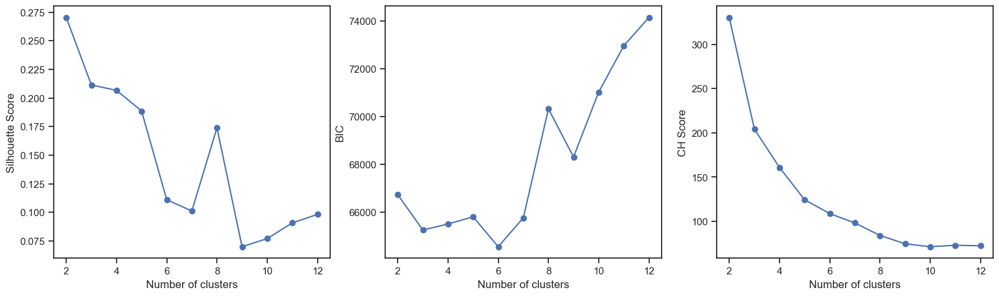

In [17]:
# perform Gaussian mixture model (gmm) clustering with k = 2 to k = 12 clusters to determine the best cluster solution based on various criteria
n_cluster_range = [i for i in range(2,13)]

# calculate the three criteria used to evaluate the cluster solutions
sil_score = []  # will store silhouette scores
bic = []  # will store bic scores
ch_score = []  # will store Calinksi-Harabasz scores

for n_cluster in n_cluster_range:
    gmm = mixture.GaussianMixture(n_components=n_cluster, random_state=5)  # the random_state parameter is set so that results are reproducible 
    gmm.fit(array_df_red)
    labels = gmm.predict(array_df_red)
    sil_score.append(silhouette_score(array_df_red, labels))
    bic.append(gmm.bic(array_df_red))
    ch_score.append(calinski_harabasz_score(array_df_red, labels))
    
# display the results both in a table and graphically 
display(pd.DataFrame(list(zip(sil_score, ch_score, bic)), columns=['silhouette_score', 'ch_score', 'bic'], index=[f'k={i}' for i in range(2, len(sil_score) + 2)]))

fig, (ax1, ax2, ax3) = plt.subplots(1,3)
fig.set_size_inches(18.5, 5)

# first plot: silhouette score
ax1.plot(n_cluster_range, sil_score, 'o-')
ax1.set(xlabel='Number of clusters', ylabel='Silhouette Score')

# second plot: BIC
ax2.plot(n_cluster_range, bic, 'o-')
ax2.set(xlabel='Number of clusters', ylabel='BIC')

# third plot: Calinksi-Harabasz score
ax3.plot(n_cluster_range, ch_score, 'o-')
ax3.set(xlabel='Number of clusters', ylabel='CH Score')

plt.show()

Observations
* all three criteria tend to favor a cluster solution with few clusters (k = 2 to k = 6 clusters), but they disagree on the exact number of clusters 
* the silhouette score and the Calinski-Harabasz score support a solution with k = 2 clusters, while the BIC favors a solution with k = 6 clusters
* according to the BIC, cluster solutions with k = 3, k = 4 or k = 5 clusters are also better than a cluster solution with k = 2 clusters
* with the silhouette score and the BIC, there is not much difference between a cluster solution with k = 3 or with k = 4 clusters

### 4.2 Determining the Best Cluster Solution

* because no cluster solution was clearly preferred by all three criteria, take a closer look at the cluster solution with k = 2, k = 3, k = 4, and k = 6 clusters
* see in which PCs the clusters differ significantly from each other
* determine the cluster solution which will be further interpreted 

#### 4.2.1 K = 2 Clusters

value counts of labels_2c :


,count,percent
1,548,0.661
0,281,0.339


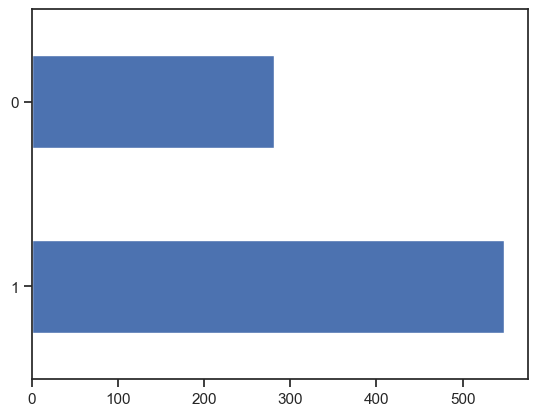

In [18]:
# perform gmm clustering with k = 2 clusters
gmm_2c = mixture.GaussianMixture(n_components=2, random_state=5)

# fit the model
gmm_2c.fit(array_df_red)

# extract the cluster predictions according to the highest probability 
labels_2c = gmm_2c.predict(array_df_red)

# save the predicted labels in the data frame
df_gmm = df_red.copy()
df_gmm['labels_2c'] = labels_2c
f.explore_feature(df_gmm['labels_2c'], original=False)

Observations
* 34% of respondents are assigned to the first cluster
* 66% of respondents are assigned to the second cluster

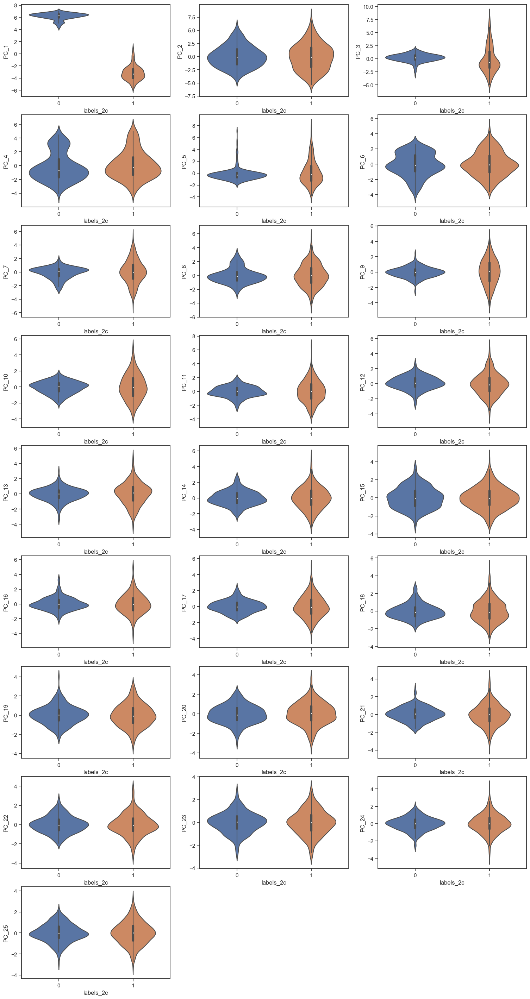

In [19]:
# create violin plots to visualize the clusters' data distribution in each PC
def show_violinplots_clusters(labels, df_data):
    """create violin plots for each cluster to show the distribution of data for the 25 PCs
    
    :param labels: the name of the variable in the dataset containing the cluster assignment ('str')
    :param df_data: the data source ('pandas.core.frame.DataFrame')
    """
    
    fig = plt.figure()
    fig.set_size_inches(18.5, 40)
    n_plot = 1
    for col in df_data:
        if 'label' in col:
            break
        ax = fig.add_subplot(10, 3, n_plot)
        sns.violinplot(x=labels, y=str(col), data=df_data, ax=ax)
        n_plot += 1
    plt.show()
    
show_violinplots_clusters('labels_2c', df_gmm)

Observations
* the clusters seem to differ mainly in PC 1

In [20]:
# check in which PCs the clusters differ significantly from each other
def perform_anovas(labels, df_data):
    """check in which PCs the clusters differ significantly from each other using analyses of variances and a bonferroni adjusted alpha level of alpha = .05
    
    :param labels: the name of the variable in the dataset containing the cluster assignment ('str')
    :param df_data: the data source ('pandas.core.frame.DataFrame')
    :return: a list containing the PCs in which clusters differed significantly from each other ('list')
    """
    
    alpha_adj = 0.05/df_data.shape[1]  # apply a Bonferroni correction to the alpha level
    significant_pc = []  # to store the PCs in which clusters differ significantly from each other

    # perform an analysis of variance (anova) for each PC
    for col in df_data:
        if 'label' in col:
            break
        model = ols(f'{col} ~ {labels}', data=df_data).fit()  # perform the anova
        anova_table = sm.stats.anova_lm(model, typ=3)
        if anova_table.at[labels, 'PR(>F)'] <= alpha_adj:  # print anova results only if the anova is significant
            print(f'Anova results for {col}')
            display(anova_table)
            significant_pc.append(col)
    return significant_pc

significant_pc_2c = perform_anovas('labels_2c', df_gmm)

Anova results for PC_1


,sum_sq,df,F,PR(>F)
Intercept,10707.119,1.000,10310.265,0.000
labels_2c,16197.448,1.000,15597.098,0.000
Residual,858.832,827.000,NaN,NaN


Observations
* as already indicated by the violin plots, clusters differ significantly from each other only in PC 1
* since PC 1 presumably records whether someone has ever suffered from a mental disorder, cluster 0 probably contains only persons without a mental disorder and cluster 1 only persons with a mental disorder
* because clusters differ significantly only in one PC, this cluster solution is not very informative with respect to the goal of the current case study

#### 4.2.2 K = 3 Clusters

value counts of labels_3c :


,count,percent
1,344,0.415
0,281,0.339
2,204,0.246


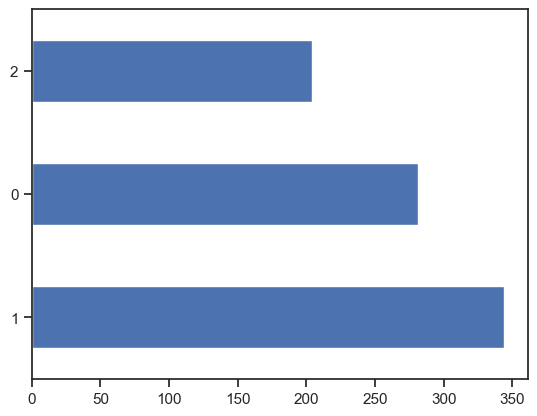

In [21]:
# perform gmm clustering with k = 3 clusters
gmm_3c = mixture.GaussianMixture(n_components=3, random_state=5)

# fit the model
gmm_3c.fit(array_df_red)

# extract the cluster predictions according to the highest probability 
labels_3c = gmm_3c.predict(array_df_red)

# save the predicted labels in the data frame
df_gmm['labels_3c'] = labels_3c
f.explore_feature(df_gmm['labels_3c'], original=False)

Observations
* as in the cluster solution with k = 2 clusters, 34% of the respondents are again assigned to the first cluster
* it is therefore possible that the first cluster is identical with the first cluster of the 2-cluster solution
* accordingly, it is possible that the cluster with the respondents with mental disorders was divided into two further clusters

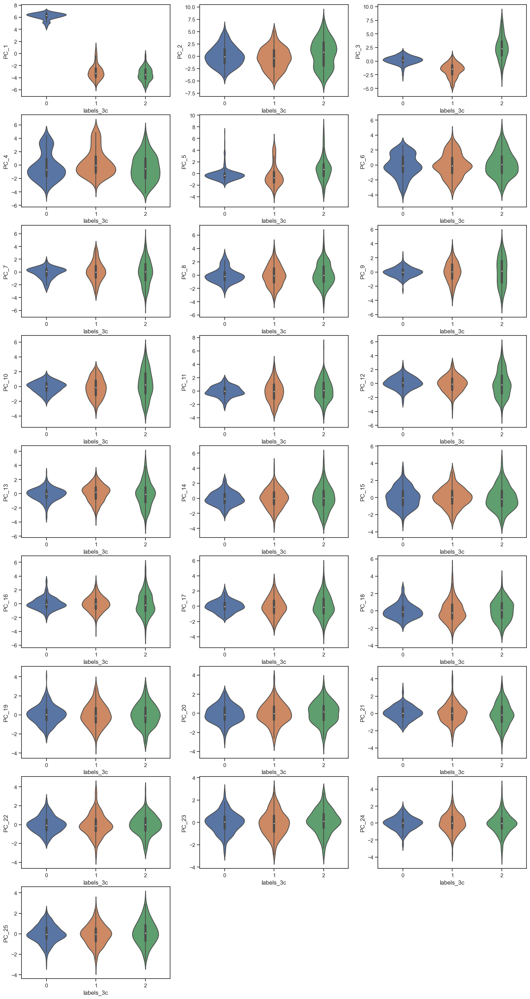

In [22]:
# create violin plots to visualize the clusters' data distribution in each PC
show_violinplots_clusters('labels_3c', df_gmm)

Observations
* visually, the three clusters differ mainly in PC 1 and in PC 3, which also suggests that the same respondents were assigned to the first cluster as in the 2-cluster solution

In [23]:
# check in which PCs the clusters differ significantly from each other
significant_pc_3c = perform_anovas('labels_3c', df_gmm)

Anova results for PC_1


,sum_sq,df,F,PR(>F)
Intercept,7256.375,1.000,1272.263,0.000
labels_3c,12339.472,1.000,2163.485,0.000
Residual,4716.808,827.000,NaN,NaN


Anova results for PC_3


,sum_sq,df,F,PR(>F)
Intercept,248.976,1.000,59.627,0.000
labels_3c,423.383,1.000,101.396,0.000
Residual,3453.162,827.000,NaN,NaN


Anova results for PC_5


,sum_sq,df,F,PR(>F)
Intercept,59.153,1.000,20.069,0.000
labels_3c,100.589,1.000,34.128,0.000
Residual,2437.501,827.000,NaN,NaN


Anova results for PC_10


,sum_sq,df,F,PR(>F)
Intercept,11.506,1.000,6.134,0.013
labels_3c,19.565,1.000,10.431,0.001
Residual,1551.210,827.000,NaN,NaN


Observations
* statistically, clusters differ in four PCs: PC 1, PC 3, PC 5, and PC 10

#### 4.2.3 K = 4 Clusters

value counts of labels_4c :


,count,percent
1,332,0.400
0,281,0.339
3,112,0.135
2,104,0.125


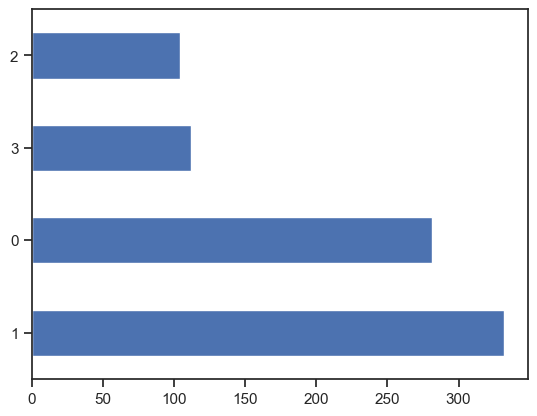

In [24]:
# perform gmm clustering with k = 4 clusters
gmm_4c = mixture.GaussianMixture(n_components=4, random_state=5) 

# fit the model
gmm_4c.fit(array_df_red)

# extract the cluster predictions according to the highest probability 
labels_4c = gmm_4c.predict(array_df_red)

# save the predicted labels in the data frame 
df_gmm['labels_4c'] = labels_4c
f.explore_feature(df_gmm['labels_4c'], original=False)

Observations
* as in the cluster solutions with k = 2 and k = 3 clusters, again 34% of the respondents are assigned to the first cluster (cluster 0) 

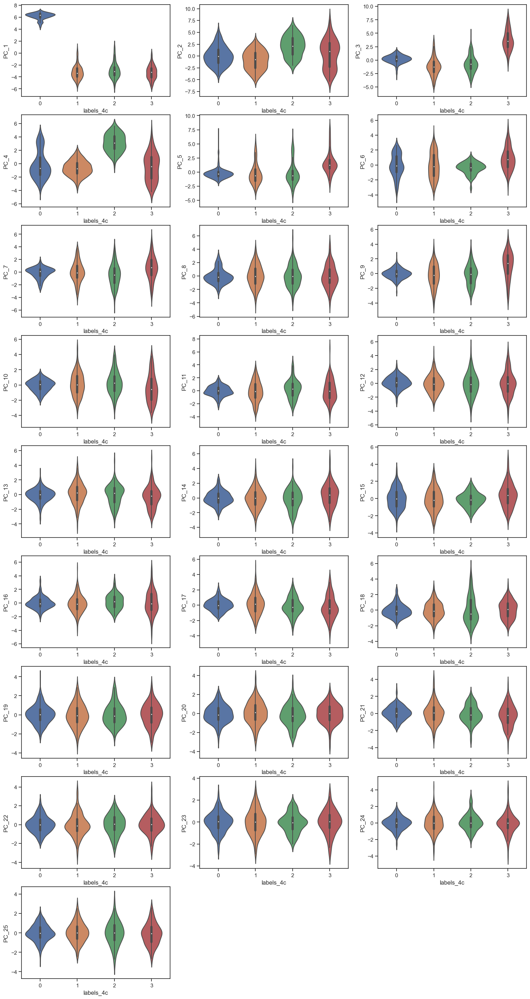

In [25]:
# create violin plots to visualize the clusters' data distribution in each PC
show_violinplots_clusters('labels_4c', df_gmm)

Observations
* visually, the four clusters differ mainly in PC 1, PC 2, PC 3, PC 4, PC 5, and PC 9
* the difference in PC 1, where cluster 0 stands out from the other clusters, again suggests that the same subjects were assigned to the first cluster as in the 2- and 3-cluster solutions

In [26]:
# check in which PCs the clusters differ significantly from each other
significant_pc_4c = perform_anovas('labels_4c', df_gmm)

Anova results for PC_1


,sum_sq,df,F,PR(>F)
Intercept,4865.577,1.000,514.148,0.000
labels_4c,9230.074,1.000,975.348,0.000
Residual,7826.206,827.000,NaN,NaN


Anova results for PC_2


,sum_sq,df,F,PR(>F)
Intercept,55.757,1.000,10.059,0.002
labels_4c,105.771,1.000,19.083,0.000
Residual,4583.900,827.000,NaN,NaN


Anova results for PC_3


,sum_sq,df,F,PR(>F)
Intercept,320.486,1.000,81.088,0.000
labels_4c,607.968,1.000,153.825,0.000
Residual,3268.578,827.000,NaN,NaN


Anova results for PC_4


,sum_sq,df,F,PR(>F)
Intercept,41.623,1.000,10.235,0.001
labels_4c,78.959,1.000,19.416,0.000
Residual,3363.096,827.000,NaN,NaN


Anova results for PC_5


,sum_sq,df,F,PR(>F)
Intercept,90.649,1.000,31.683,0.000
labels_4c,171.963,1.000,60.104,0.000
Residual,2366.127,827.000,NaN,NaN


Anova results for PC_6


,sum_sq,df,F,PR(>F)
Intercept,17.146,1.000,6.989,0.008
labels_4c,32.526,1.000,13.258,0.000
Residual,2028.955,827.000,NaN,NaN


Anova results for PC_9


,sum_sq,df,F,PR(>F)
Intercept,35.262,1.000,18.001,0.000
labels_4c,66.892,1.000,34.149,0.000
Residual,1619.967,827.000,NaN,NaN


Observations
* in addition to the PCs where visual differences have already been identified, the clusters also differ significantly in PC 6
* accordingly, there are significant differences in a total of 7 PCs

#### 4.2.4 K = 6 Clusters

value counts of labels_6c :


,count,percent
1,251,0.303
0,206,0.248
4,135,0.163
2,103,0.124
5,75,0.090
3,59,0.071


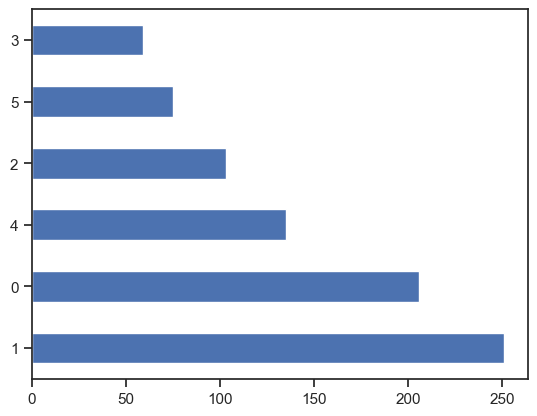

In [27]:
# perform gmm clustering with k = 6 clusters
gmm_6c = mixture.GaussianMixture(n_components=6, random_state=5)

# fit the model
gmm_6c.fit(array_df_red)

# extract the cluster predictions according to the highest probability 
labels_6c = gmm_6c.predict(array_df_red)

# save the predicted labels in the data frame
df_gmm['labels_6c'] = labels_6c
f.explore_feature(df_gmm['labels_6c'], original=False)

Observations
* this time no group consists of exactly 281 subjects, which indicates that with six clusters also the respondents without mental disorders were no longer assigned to the same cluster
* it is possible that cluster 0 and cluster 5 contain respondents without mental disorders (contain 281 respondents together)
* two clusters (cluster 5 and cluster 3) were assigned less than 10% of the respondents

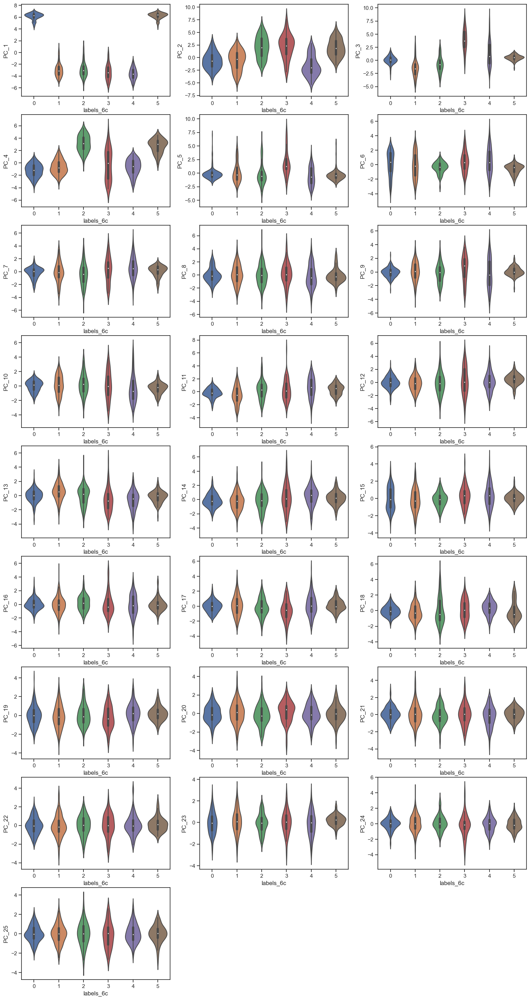

In [28]:
# create violin plots to visualize the clusters' data distribution in each PC
show_violinplots_clusters('labels_6c', df_gmm)

Observations
* visually, the six clusters differ mainly in PC 1, PC 2, PC 3 and PC 4 
* the difference between clusters in PC 1 confirms the assumption that the individuals without mental disorders were divided into two clusters, because two clusters have high scores on PC 1, while the other clusters have low scores on PC 1

In [29]:
# check in which PCs the clusters differ significantly from each other
significant_pc_6c = perform_anovas('labels_6c', df_gmm)

Anova results for PC_1


,sum_sq,df,F,PR(>F)
Intercept,569.844,1.000,29.405,0.000
labels_6c,1029.500,1.000,53.123,0.000
Residual,16026.780,827.000,NaN,NaN


Anova results for PC_2


,sum_sq,df,F,PR(>F)
Intercept,64.702,1.000,11.701,0.001
labels_6c,116.892,1.000,21.140,0.000
Residual,4572.779,827.000,NaN,NaN


Anova results for PC_3


,sum_sq,df,F,PR(>F)
Intercept,258.650,1.000,62.742,0.000
labels_6c,467.285,1.000,113.352,0.000
Residual,3409.261,827.000,NaN,NaN


Anova results for PC_4


,sum_sq,df,F,PR(>F)
Intercept,273.580,1.000,76.752,0.000
labels_6c,494.259,1.000,138.664,0.000
Residual,2947.796,827.000,NaN,NaN


Anova results for PC_7


,sum_sq,df,F,PR(>F)
Intercept,19.299,1.000,8.930,0.003
labels_6c,34.867,1.000,16.133,0.000
Residual,1787.313,827.000,NaN,NaN


Anova results for PC_11


,sum_sq,df,F,PR(>F)
Intercept,52.843,1.000,31.183,0.000
labels_6c,95.469,1.000,56.336,0.000
Residual,1401.472,827.000,NaN,NaN


Anova results for PC_13


,sum_sq,df,F,PR(>F)
Intercept,35.587,1.000,23.009,0.000
labels_6c,64.292,1.000,41.569,0.000
Residual,1279.057,827.000,NaN,NaN


Anova results for PC_14


,sum_sq,df,F,PR(>F)
Intercept,22.603,1.000,14.621,0.000
labels_6c,40.836,1.000,26.414,0.000
Residual,1278.522,827.000,NaN,NaN


Observations
* in addition to the PCs where visual differences have already been found, the clusters also differ significantly in PC 7, PC 11, PC 13, and PC 14
* correspondingly, there are significant differences in a total of eight PCs
* however, clusters differ significantly from each other only in five of the first 10 PCs 

Conclusions
* the 4-cluster solution is considered the best solution:
    * in the 4-cluster solution, while there were fewer significant differences overall between clusters than in the 6-cluster solution, there were more significant differences among PCs explaining most of the variance in the data
    * in the 4-cluster solution, the clusters differed significantly in the first six PCs, while for the 6-cluster solution this was the case only for the first four PCs
    * the silhouette and the Calinski-Harabasz score are clearly better for the 4-cluster solution than for the 6-cluster solution

### 4.3 Interpret the Best Cluster Solution

* display the probability with which respondents were assigned to the four clusters
* look at the original dataset and the values of the respondents on the variables that loaded highest on the PCs

In [30]:
# display the probabilities with which respondents were assigned to the four clusters
n_clusters = 4
probs = gmm_4c.predict_proba(array_df_red)  # retrieve the probabilities
cols = [f'cluster{i}' for i in range(1, n_clusters+1)]
df_probs = pd.DataFrame(probs, columns=cols)  # create a data frame containing the probabilities for each respondent in each cluster

# discretize probabilities
bins = [-0.1, 0, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 1] 
binned_probs = pd.DataFrame()
for col in df_probs:
    binned_counts = pd.cut(sorted(df_probs[col].to_numpy()), bins)
    binned_probs[col] = pd.value_counts(binned_counts)
display(binned_probs.sort_index())

,cluster1,cluster2,cluster3,cluster4
"(-0.1, 0.0]",527,225,626,0
"(0.0, 0.05]",21,271,99,717
"(0.05, 0.1]",0,0,0,0
"(0.1, 0.2]",0,1,0,0
"(0.2, 0.3]",0,0,0,0
"(0.3, 0.4]",0,0,0,0
"(0.4, 0.5]",0,0,0,0
"(0.5, 0.6]",0,0,0,0
"(0.6, 0.7]",0,0,0,0
"(0.7, 0.8]",0,0,0,0


Observations
* all respondents were assigned to one of the four clusters with at least 80% probability
* only one respondent was assigned to a cluster with less than 95% probability

In [31]:
# follow up the significant anovas with Tukey's tests
labels = 'labels_4c'
for pc in significant_pc_4c:
    res = stat()
    res.tukey_hsd(df=df_gmm, res_var=pc, xfac_var=labels, anova_model=f'{pc} ~ {labels}')
    print(f'Tukey\'s tests for {pc}')
    display(res.tukey_summary)

Tukey's tests for PC_1


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,2,1,0.261,-0.629,1.151,1.067,0.862
1,2,0,9.118,8.209,10.027,36.521,0.001
2,2,3,0.302,-0.776,1.381,1.021,0.880
3,1,0,9.379,8.737,10.021,53.192,0.001
4,1,3,0.042,-0.824,0.907,0.175,0.900
5,0,3,9.421,8.536,10.306,38.756,0.001


Tukey's tests for PC_2


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,2,1,2.960,2.279,3.641,15.823,0.001
1,2,0,2.039,1.343,2.734,10.669,0.001
2,2,3,1.675,0.850,2.501,7.391,0.001
3,1,0,0.922,0.430,1.413,6.829,0.001
4,1,3,1.285,0.622,1.947,7.062,0.001
5,0,3,0.363,-0.314,1.040,1.952,0.511


Tukey's tests for PC_3


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,2,1,0.502,-0.073,1.077,3.179,0.112
1,2,0,0.895,0.308,1.482,5.547,0.001
2,2,3,4.442,3.745,5.139,23.205,0.001
3,1,0,1.397,0.982,1.812,12.261,0.001
4,1,3,4.944,4.385,5.503,32.186,0.001
5,0,3,3.547,2.975,4.119,22.580,0.001


Tukey's tests for PC_4


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,2,1,3.787,3.204,4.370,23.633,0.001
1,2,0,3.282,2.687,3.878,20.055,0.001
2,2,3,3.629,2.922,4.336,18.690,0.001
3,1,0,0.504,0.084,0.925,4.364,0.011
4,1,3,0.158,-0.410,0.725,1.012,0.883
5,0,3,0.347,-0.233,0.927,2.176,0.416


Tukey's tests for PC_5


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,2,1,0.100,-0.389,0.590,0.746,0.900
1,2,0,0.011,-0.488,0.511,0.083,0.900
2,2,3,1.712,1.119,2.305,10.511,0.001
3,1,0,0.089,-0.264,0.442,0.917,0.900
4,1,3,1.812,1.336,2.288,13.866,0.001
5,0,3,1.723,1.237,2.210,12.894,0.001


Tukey's tests for PC_6


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,2,1,0.294,-0.159,0.747,2.365,0.339
1,2,0,0.338,-0.124,0.801,2.661,0.237
2,2,3,1.242,0.693,1.791,8.235,0.001
3,1,0,0.044,-0.283,0.371,0.490,0.900
4,1,3,0.948,0.507,1.388,7.831,0.001
5,0,3,0.904,0.453,1.354,7.302,0.001


Tukey's tests for PC_9


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,2,1,0.099,-0.305,0.504,0.894,0.900
1,2,0,0.160,-0.254,0.574,1.409,0.726
2,2,3,1.293,0.802,1.783,9.591,0.001
3,1,0,0.259,-0.033,0.552,3.234,0.102
4,1,3,1.392,0.998,1.786,12.872,0.001
5,0,3,1.133,0.730,1.535,10.240,0.001


Observations
* not all clusters differ significantly from each other in all PCs 
* in PC 1, only cluster 0 is significantly different from all other clusters
* in PC 2, all clusters differ significantly from each other except cluster 0 and cluster 3
* in PC 3, there were significant differences between all clusters except cluster 1 and cluster 2
* in PC 4, only cluster 2 differed significantly from the other clusters
* with respect to the remaining three PCs with significant differences, only cluster 3 differed significantly from the other clusters 

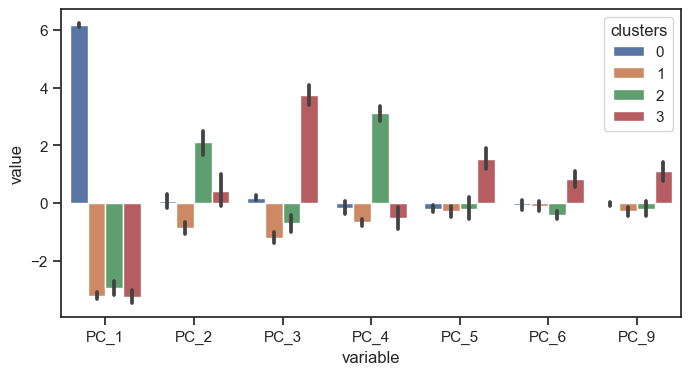

In [32]:
# visualize the significant differences in a bar plot to be able to interpret them
fig = plt.figure()
fig.set_size_inches(8, 4)

# create a data frame containing only the significant pcs as well as the label
df_sign_pcs = df_gmm[significant_pc_4c + ['labels_4c']].copy()
df_sign_pcs.rename(columns={'labels_4c':'clusters'}, inplace=True)
df_sign_pcs_melt = pd.melt(df_sign_pcs, id_vars=['clusters'], value_vars=significant_pc_4c)

# create the bar plot with a 95% confidence interval as error bar 
sns.barplot(data=df_sign_pcs_melt, x='variable', y='value', hue='clusters')
plt.show()

Observations
* visually, cluster 3 stands out from the other PCs by considerably higher values in most PCs, except in PC 1, PC 2, and PC 4
* in PC 1, cluster 0 has positive values, all other clusters have negative values
* in PC 2 and PC 4, cluster 2 stands out visually the most from the other clusters, but cluster 1 also distinguishes itself in PC 2 by negative values

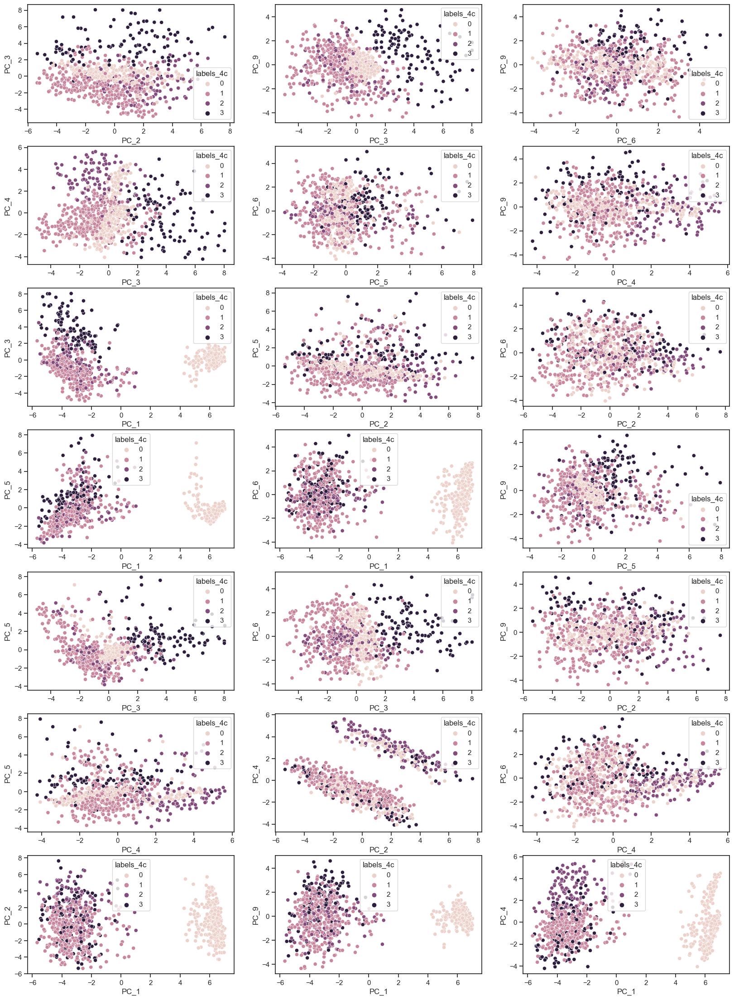

In [33]:
# create 2D visualizations of the four clusters, showing the distribution of each of the four clusters in relation to two PCs
# create all possible combinations of two PCs from the PCs where clusters showed significant differences
combinations = set(itertools.combinations(significant_pc_4c, 2))
fig = plt.figure()
fig.set_size_inches(20, 40)

n_plot = 1
for pcs in combinations:
    ax = fig.add_subplot(10, 3, n_plot) 
    sns.scatterplot(data=df_gmm, x=pcs[0], y=pcs[1], hue='labels_4c', ax=ax)
    n_plot += 1
    
plt.show()

Observations
* the clustering appears clearest when the clusters are shown as a function of PC 1 and PC 3
* the four clusters can also be recognized quite well when the clusters are depicted as a function of PC 3 and PC 4

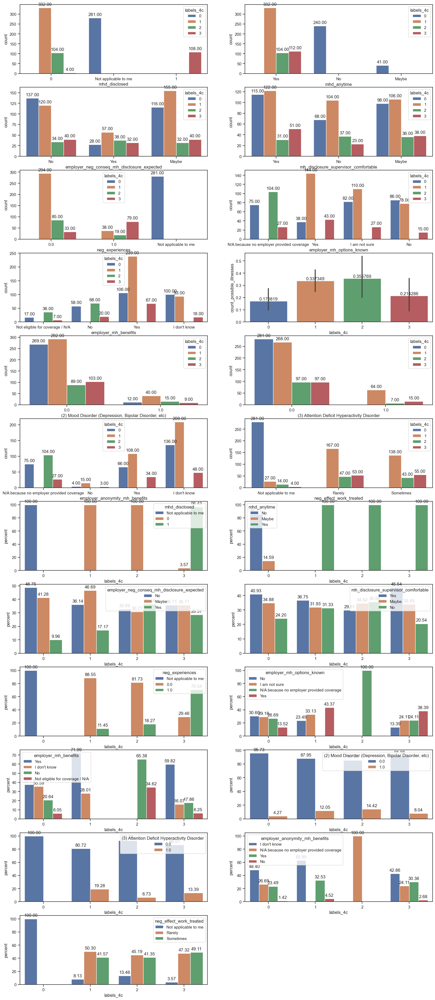

In [34]:
# look at the values of the four clusters in the two variables that are not redundant and that have loaded highest on the PCs 

# append the label to the dataset containing the original variables
df_final = pd.read_csv('df_final.csv') # load the final dataset that has not yet been numerically encoded 
df_final['labels_4c'] = labels_4c

fig = plt.figure()
fig.set_size_inches(20, 80)

# identify the two non-redundant variables for each PC with the highest absolute, yet different loadings
vars_high_loadings = ['mhd_disclosed', 'mhd_anytime', 'employer_neg_conseq_mh_disclosure_expected', 'mh_disclosure_supervisor_comfortable', 'neg_experiences', 'employer_mh_options_known', 'employer_mh_benefits',
                     'count_possible_illnesses', '(2) Mood Disorder (Depression, Bipolar Disorder, etc)', '(3) Attention Deficit Hyperactivity Disorder', 'employer_anonymity_mh_benefits', 
                      'neg_effect_work_treated']

# create a data dictionary to identify ratio-scaled variables that need to be displayed differently than the categorical variables
data_dict_vx = f.create_data_dict(df_final)
dict_type = dict(zip(data_dict_vx['variable'].to_list(), data_dict_vx['data_types'].to_list()))
ratio_vars = [var for var in vars_high_loadings if dict_type[var] == 'ratio']

def annotate_bar_diagrams(bar_diagram):
    """annotate each bar of a barplot with the corresponding value
    
    :param bar_diagram: the bar diagram to be annotated ('matplotlib.axes._subplots.AxesSubplot')
    """
    
    for bar in bar_diagram.patches:
        bplot.annotate(format(bar.get_height(), '.2f'), 
                       (bar.get_x() + bar.get_width() / 2., bar.get_height()), 
                       ha = 'center', va = 'center', 
                       xytext = (0, 9), 
                       textcoords = 'offset points')

# visualize the values of individuals in the variables as a function of their cluster
n_plot = 1
for var in vars_high_loadings:
    ax = fig.add_subplot(20, 2, n_plot)
    # use bar charts showing cluster means for ratio-scaled variables
    if var in ratio_vars: 
        ratio_plot = sns.barplot(data=df_final, x='labels_4c', y=var, ax=ax)
        plt.bar_label(ratio_plot.containers[0])
    # for categorical variables, use bar charts that show the number of individuals in the clusters who chose a certain response to the variable
    else: 
        bplot = sns.countplot(data=df_final, x=var, hue='labels_4c', ax=ax)
        annotate_bar_diagrams(bplot)
    n_plot += 1

# for categorical variables, also show per cluster how many individuals in percentage chose which answer
for var in vars_high_loadings:
    if var not in ratio_vars:
        ax = fig.add_subplot(20, 2, n_plot)
        bplot = (df_final.groupby('labels_4c')[var].value_counts(normalize=True).mul(100).rename('percent').reset_index().pipe((sns.barplot,'data'), x='labels_4c',y='percent',hue=var, ax=ax))
        annotate_bar_diagrams(bplot)
        n_plot += 1

plt.show()

Observations
* cluster 0 contains only individuals who have never, or only maybe ever, suffered from a mental disorder, the other three clusters contain only individuals with mental disorders
* the number of possible disorders is higher in clusters 1 and 2 than in cluster 3
* in cluster 3, most individuals disclosed their mental disorder in the work context, unlike in clusters 1 and 2, where no individual disclosed their mental disorder
* in cluster 2, most individuals expect negative effects after disclosure of mental problems, while in the other clusters this is the option the fewest individuals have chosen
* in cluster 2, most individuals do not feel comfortable telling their supervisor about their mental disorder, while in the other clusters this is the option chosen by the fewest individuals 
* in cluster 3, in percentage terms, most have had negative experiences at work due to their mental disorder, while in cluster 1, fewest individuals have had negative experiences at work due to their mental disorder
* all individuals in cluster 2 could not benefit from their employer's provided mental health care because the employer either does not provide it or they are not eligible for it
* in cluster 1, there are no individuals whose employer does not provide mental health care or who definitely know that they are not eligible for mental health care options
* more individuals in cluster 1 and in cluster 3, on a percentage basis, know about the mental health care options provided by their employer than do not. In cluster 0, this is the other way around. 
* in cluster 2, the percentage who suspect a mood disorder is highest, but only slightly higher than in cluster 1
* in cluster 1, the percentage diagnosed with attention deficit hyperactivity disorder is highest, followed by cluster 3 and cluster 2
* in terms of knowing to what extent anonymity is protected when using mental health care options, all clusters (except cluster 2 due to lack of mental health care) do not differ too much from each other. In all three clusters, most individuals are unsure about their anonymity. 
* unlike in cluster 1 and in cluster 2, in cluster 3 most individuals expect that the mental disorder will often have a negative impact on work if it is treated effectively. In cluster 1 and in cluster 2, more individuals expect that the mental disorder will rarely have a negative effect on work if treated effectively 

age                                                 N_employees  \
            count   mean   std    min    25%    50%    75%    max       count   
labels_4c                                                                       
0         281.000 33.064 7.377 19.000 28.000 32.000 37.000 59.000     281.000   
1         332.000 33.985 7.818 20.000 28.000 33.000 39.000 70.000     332.000   
2         104.000 32.452 8.671 21.000 26.000 30.000 37.000 66.000     104.000   
3         112.000 33.929 7.202 20.000 29.000 32.000 37.250 56.000     112.000   

                                                     
           mean   std   min   25%   50%   75%   max  
labels_4c                                            
0         2.637 1.506 0.000 1.000 2.000 4.000 5.000  
1         3.015 1.459 0.000 2.000 3.000 5.000 5.000  
2         2.231 1.697 0.000 1.000 2.000 3.000 5.000  
3         2.848 1.478 0.000 2.000 3.000 4.000 5.000

gender,female,male,other
labels_4c,,,
0,0.157,0.840,0.004
1,0.298,0.678,0.024
2,0.221,0.683,0.096
3,0.321,0.625,0.054


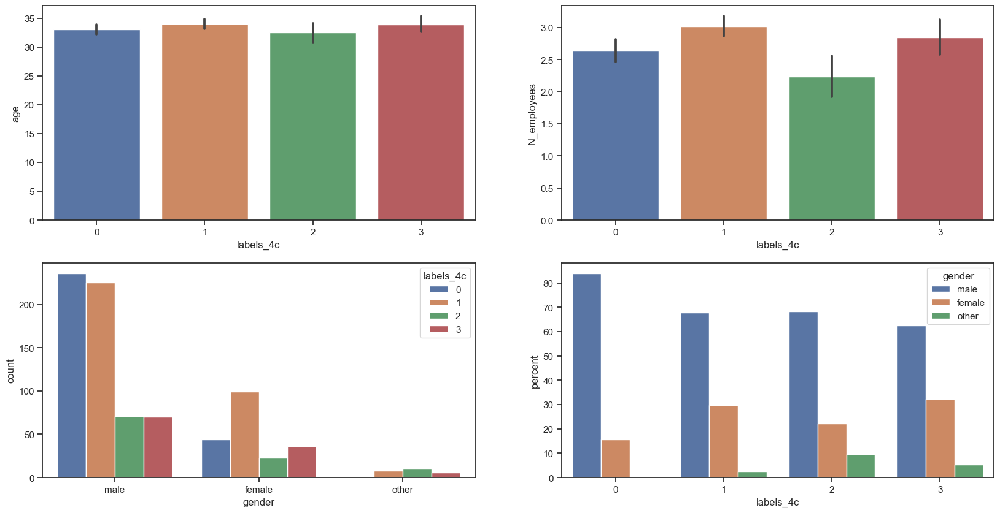

In [35]:
# look at demographic characteristics (age, company size and gender) as a function of cluster assignment 
# add the label to the encoded variables
df_enc['labels_4c'] = labels_4c

# display descriptive statistics for demographic variables
df_enc_grouped = df_enc.groupby('labels_4c')
display(df_enc_grouped[['age', 'N_employees']].describe())
df_gender = pd.pivot_table(df_final, index='labels_4c', columns='gender', aggfunc='size', dropna=False)
df_gender_pct = df_gender.div(df_gender.sum(1), 0) # to divide each cell by its row sum
display(df_gender_pct)

# visualize the demographic differences
fig, axs = plt.subplots(2,2)
fig.set_size_inches(20, 10)

sns.barplot(data=df_enc, x='labels_4c', y='age', ax=axs[0,0])
sns.barplot(data=df_enc, x='labels_4c', y='N_employees', ax=axs[0,1])
sns.countplot(data=df_final, x='gender', hue='labels_4c', ax=axs[1,0])
(df_final.groupby('labels_4c')['gender'].value_counts(normalize=True).mul(100).rename('percent').reset_index().pipe((sns.barplot,'data'), x='labels_4c',y='percent',hue='gender', ax=axs[1,1]))
plt.show()

Observations
* clusters differ only very slightly in their age 
* in cluster 2, the number of employees in the company is lowest on average, in cluster 1 it is highest
* in cluster 0, the proportion of males was the highest, while the proportion of the "other" gender was the highest in cluster 2 
* clusters 1 and 3 had the highest percentage of women 